## 01. IT24102240 – Encoding Categorical Variables

##### Technique: Converted text-based labels (e.g., "image1", "image2") into numeric labels using Label Encoding.

##### Problem: ML models like SVM cannot handle text labels.

##### Solution: Created a dictionary to map text → numbers.

##### Why Needed: Converts human-readable labels into machine-readable values for supervised learning.

##### Visualization: Bar chart showing class distribution.

In [2]:
import os 
import numpy as np 

data_path = r'C:\Users\Rasindu\Desktop\2025-Y2-S1-MLB-B9G1-02\2025-Y2-S1-MLB-B9G1-02\data\raw\Use Data\Target'
labels = os.listdir(data_path)
categories = np.arange(len(labels))
category_dict = dict(zip(labels, categories))
print(labels)
print(categories)
print(category_dict)

['Barack Obama', 'Colin_Powell', 'Donald Trump', 'Donald_Rumsfeld', 'George_W_Bush', 'Tony_Blair']
[0 1 2 3 4 5]
{'Barack Obama': np.int64(0), 'Colin_Powell': np.int64(1), 'Donald Trump': np.int64(2), 'Donald_Rumsfeld': np.int64(3), 'George_W_Bush': np.int64(4), 'Tony_Blair': np.int64(5)}


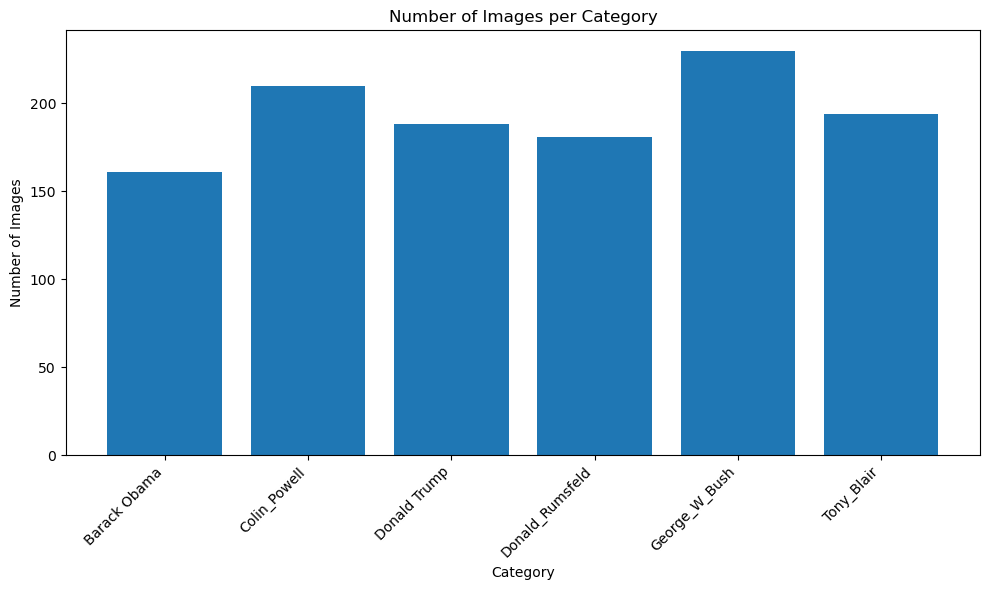

In [3]:
import matplotlib.pyplot as plt
import os

image_counts = {}
for label in labels:
    category_path = os.path.join(data_path, label)
    if os.path.isdir(category_path):
        image_counts[label] = len([f for f in os.listdir(category_path) if os.path.isfile(os.path.join(category_path, f))])

categories = list(image_counts.keys())
counts = list(image_counts.values())

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(categories, counts)
plt.xlabel("Category")
plt.ylabel("Number of Images")
plt.title("Number of Images per Category")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# 02. IT24102217 – Face Detection and Cleaning
###### Technique: Image loading, grayscale conversion, Haar Cascade detection, cropping, resizing.
###### Problem: Dataset contained unreadable images and photos without detectable faces, causing noise.
###### Solution:

Skip unreadable images.

Convert images to grayscale.

Detect faces using Haar Cascade.

Crop and resize detected face regions (50×50).

Append only valid faces to dataset.

Flatten images into vectors (2500 features).

###### Why Needed: Guarantees clean, standardized face-only data, improving reliability of training and reducing errors.
###### Visualization: Bar chart showing valid faces collected vs. skipped images (load error / no face).

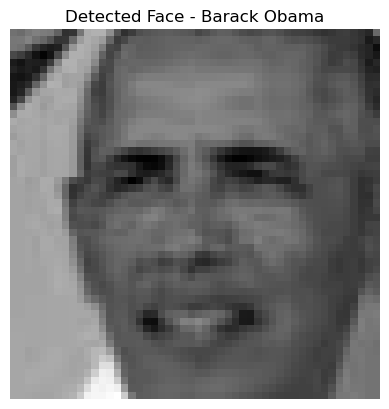

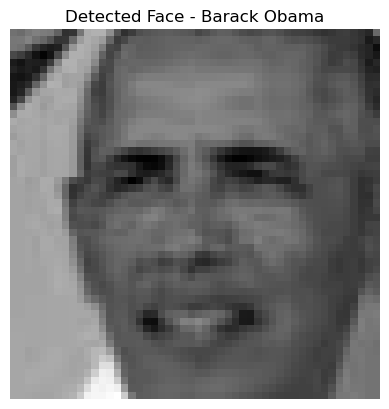

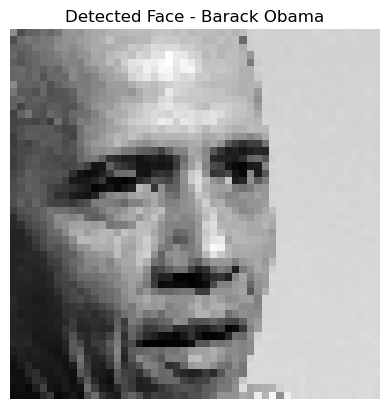

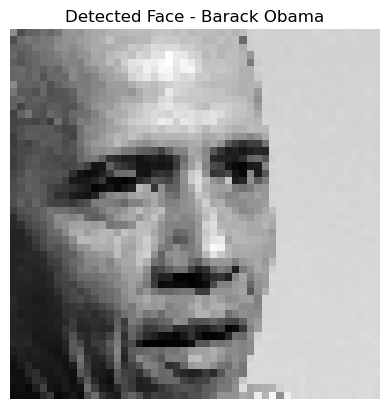

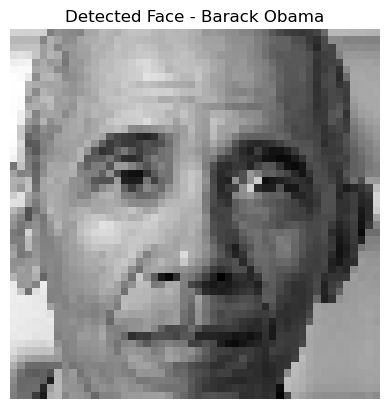

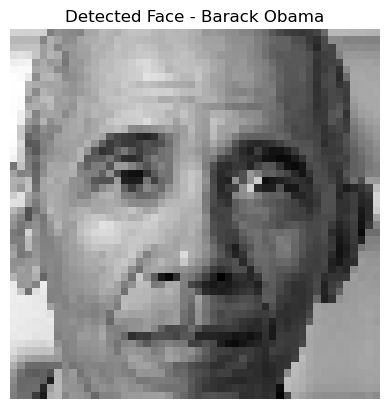

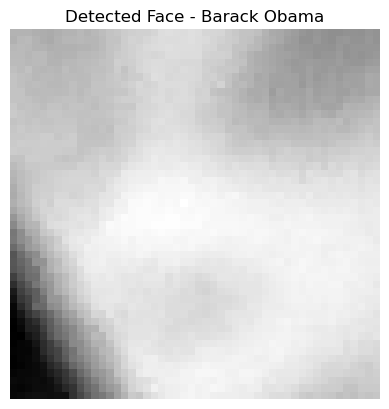

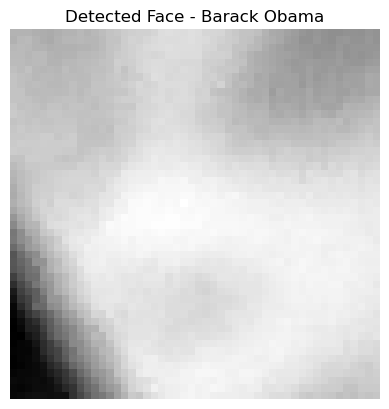

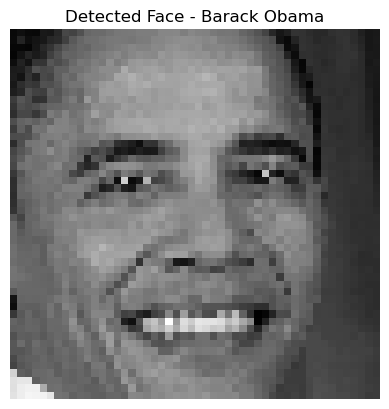

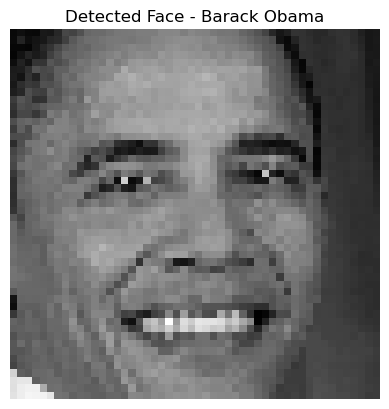

No faces detected in [www.google.com][11687] - Copy.jpg
No faces detected in [www.google.com][11687].jpg


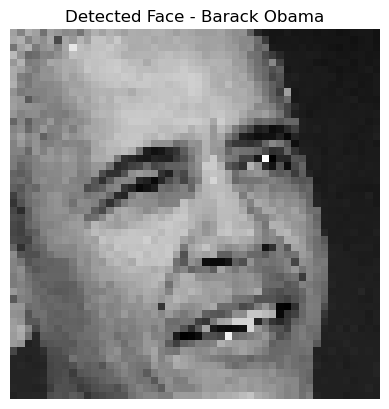

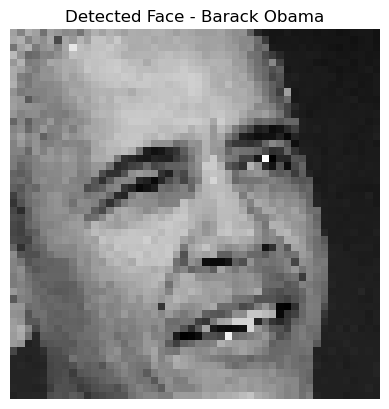

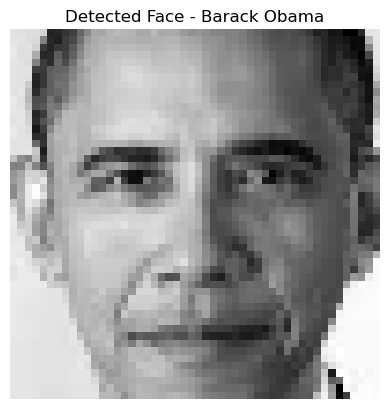

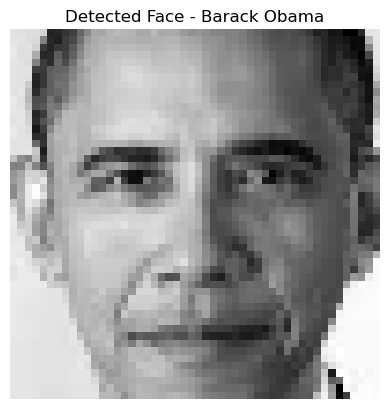

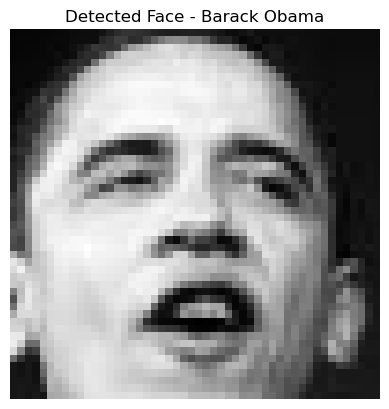

...

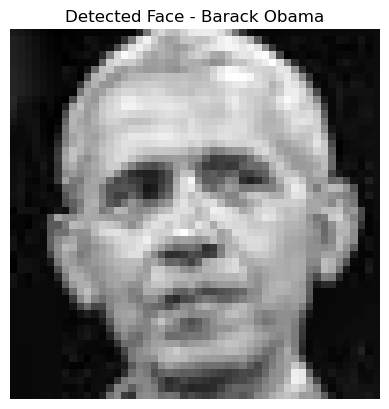

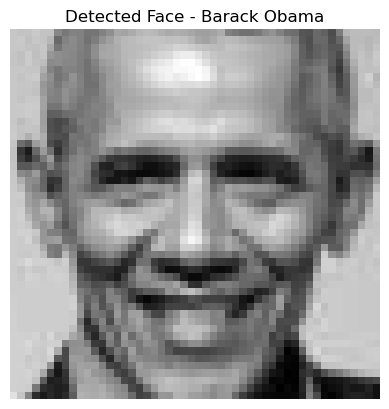

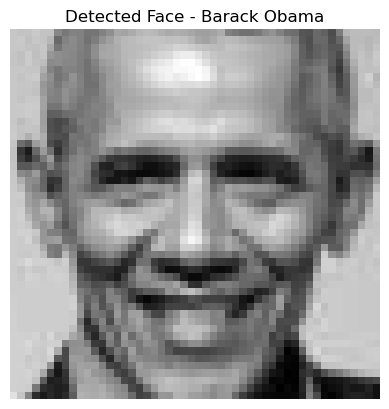

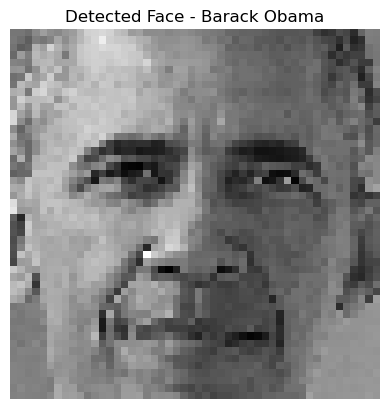

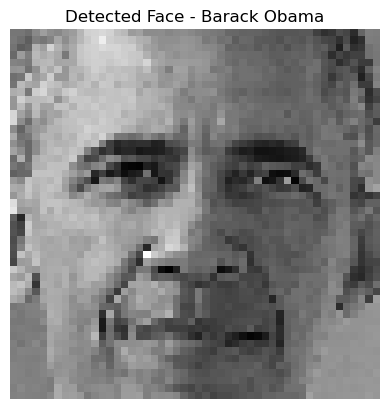

No faces detected in [www.google.com][176]6e090a007f6e0efc04d65937bfb712e9a3-16-barack-obama.rsquare.w1200 - Copy.jpg
No faces detected in [www.google.com][176]6e090a007f6e0efc04d65937bfb712e9a3-16-barack-obama.rsquare.w1200.jpg


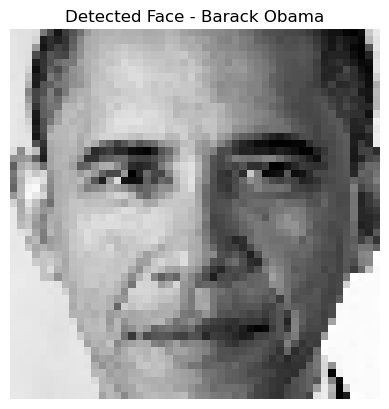

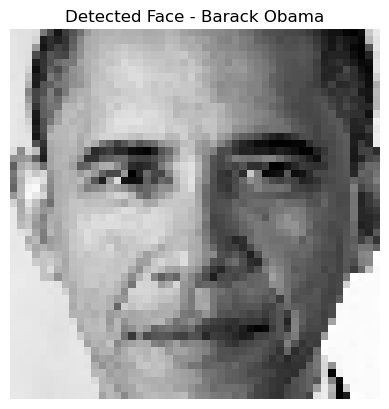

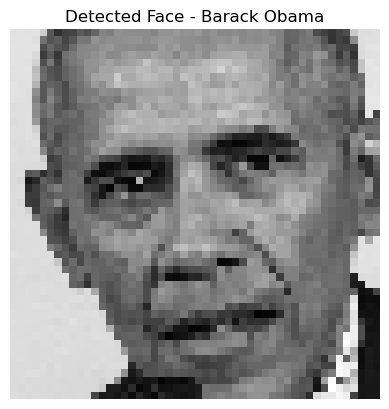

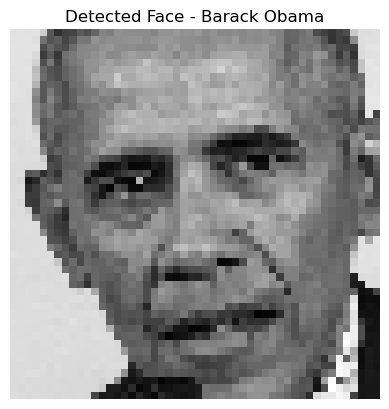

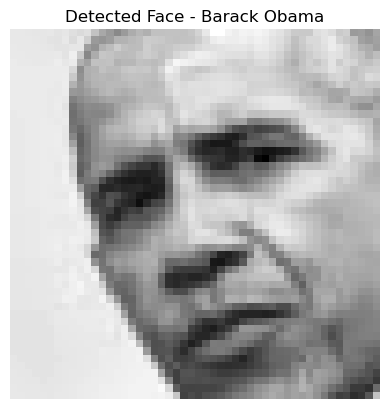

...

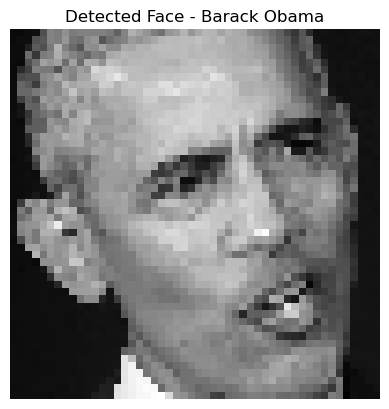

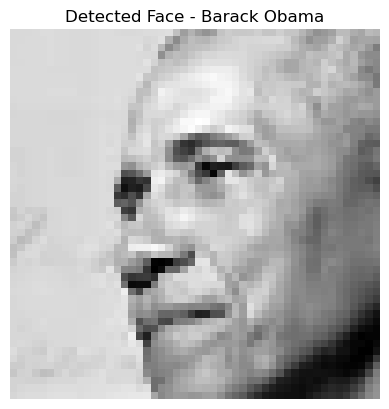

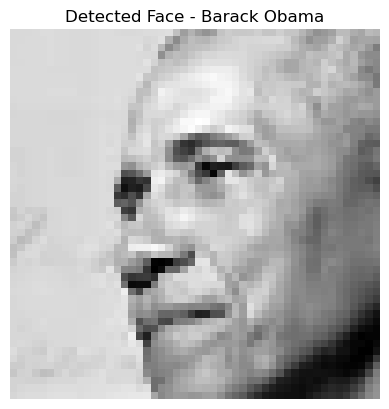

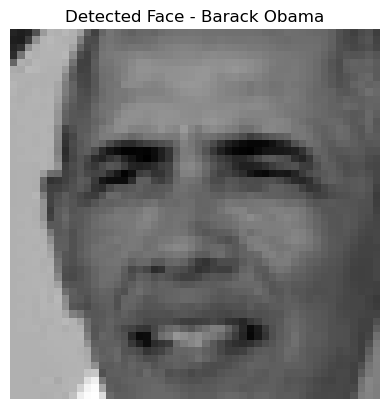

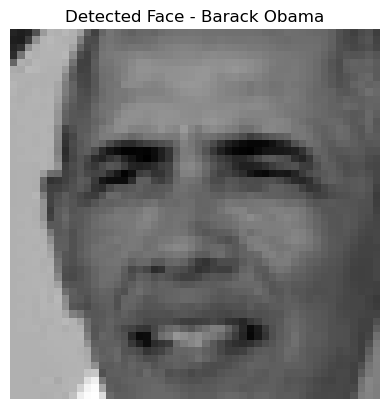

No faces detected in [www.google.com][301]obama-compressor - Copy.jpg
No faces detected in [www.google.com][301]obama-compressor.jpg


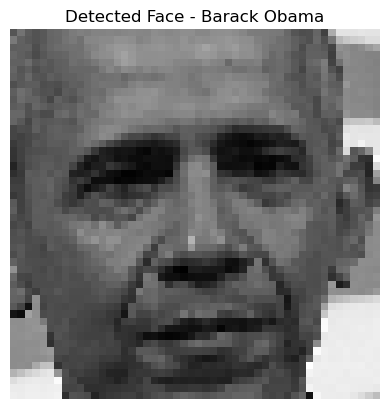

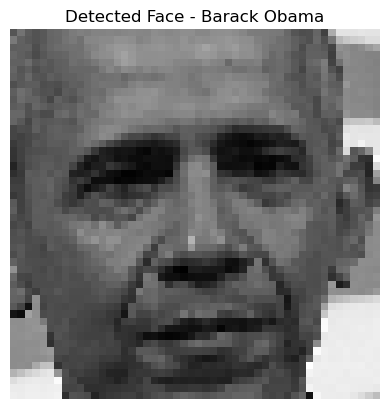

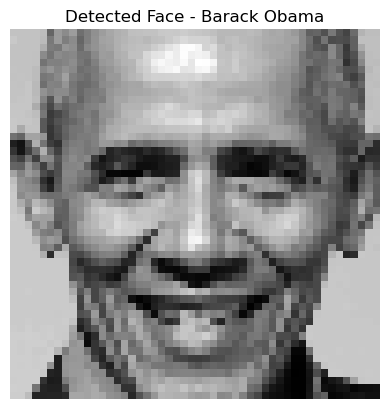

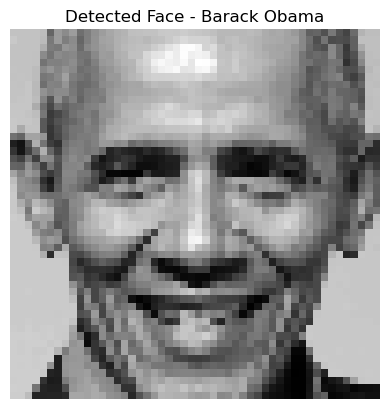

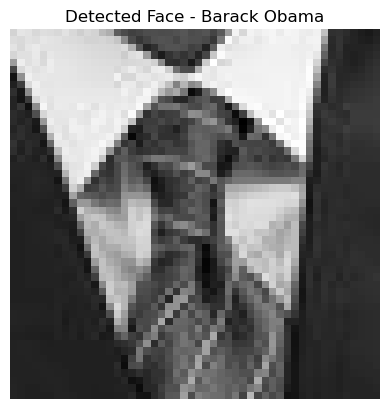

...

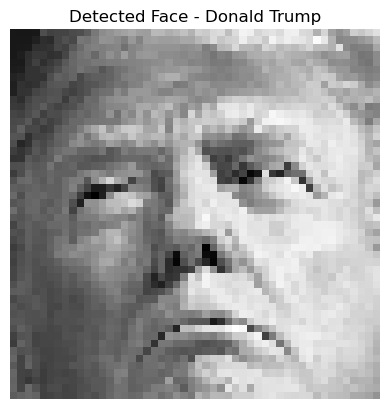

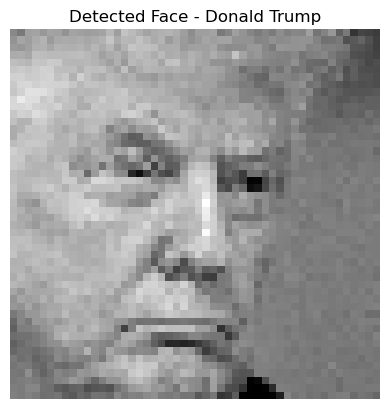

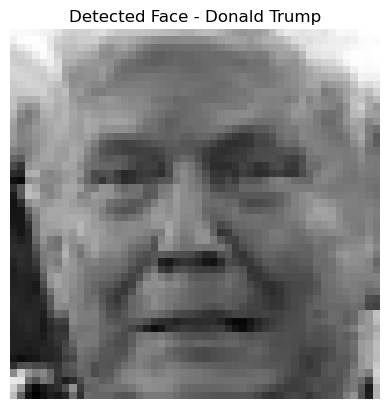

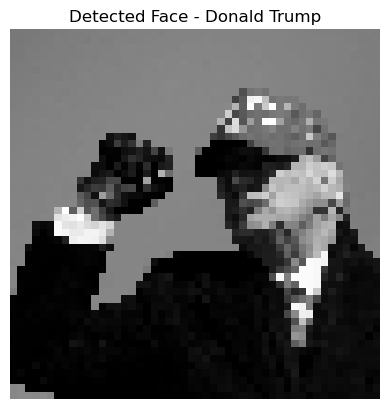

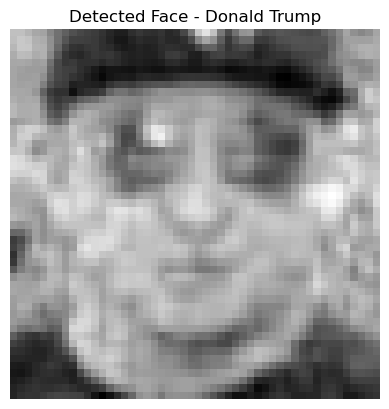

No faces detected in [www.google.com][164]20282765_web1_AP20023732424237.jpg


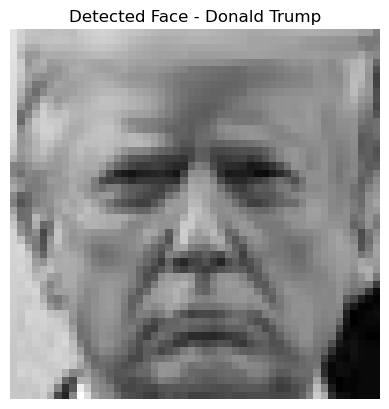

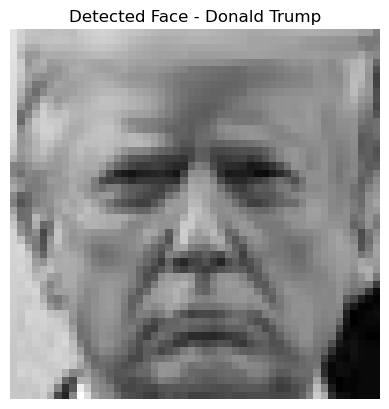

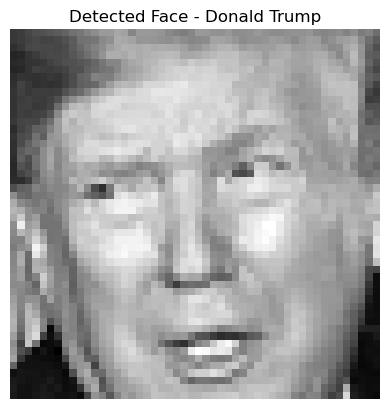

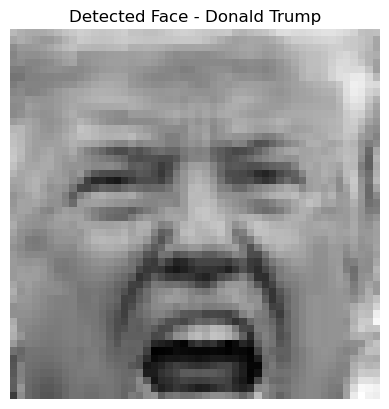

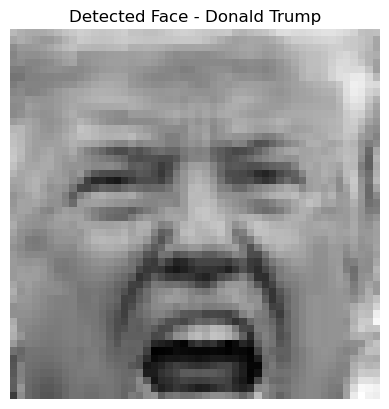

No faces detected in [www.google.com][17621] - Copy.jpg
No faces detected in [www.google.com][17621].jpg


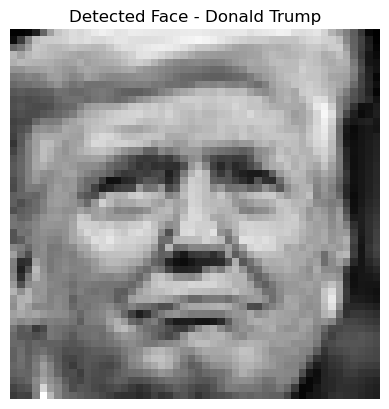

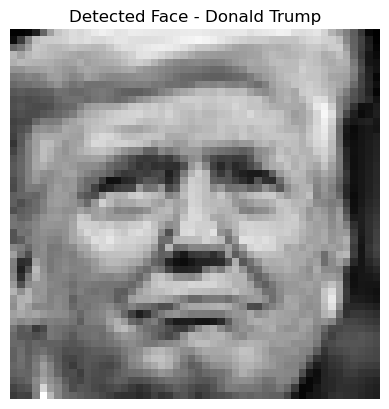

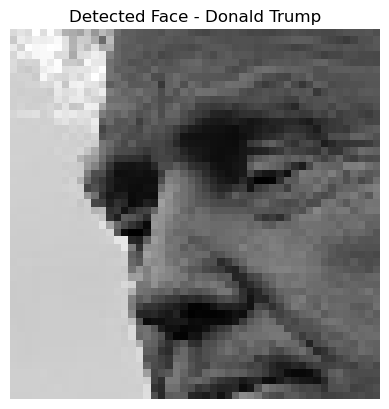

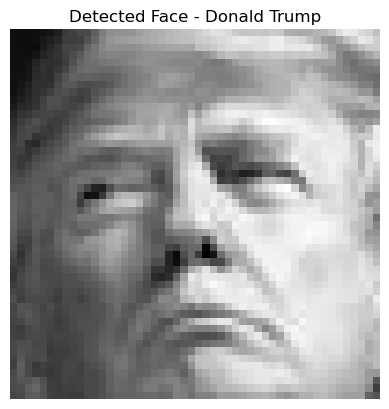

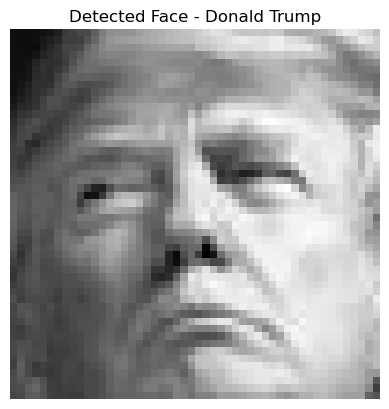

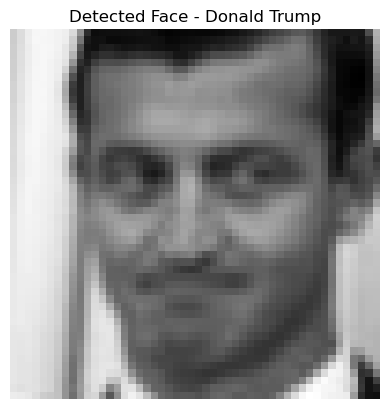

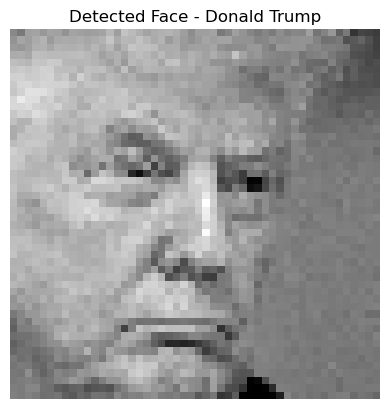

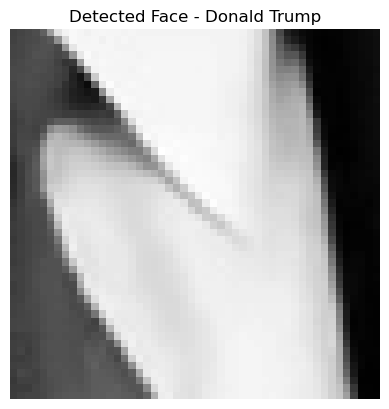

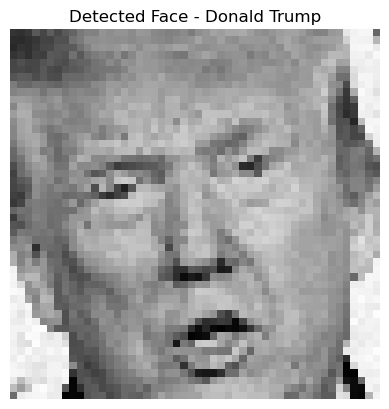

No faces detected in [www.google.com][21666] - Copy.jpg
No faces detected in [www.google.com][21666].jpg


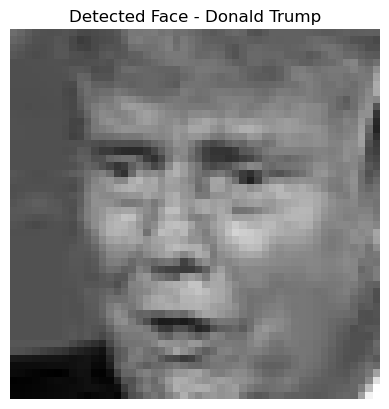

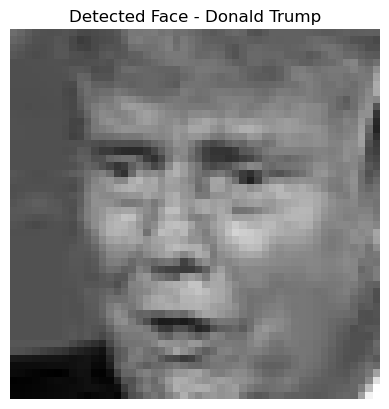

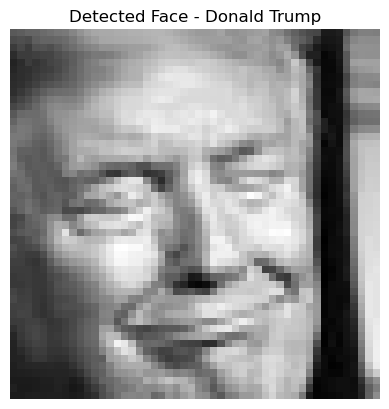

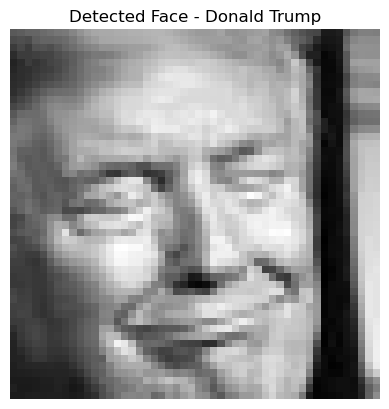

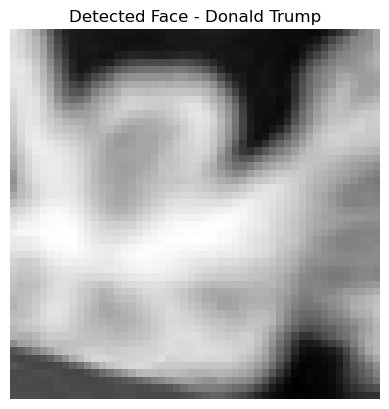

No faces detected in [www.google.com][234]12724684-3x2-xlarge.jpg


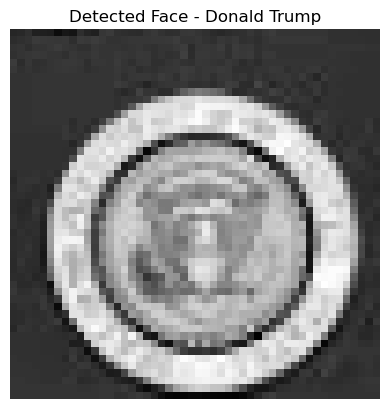

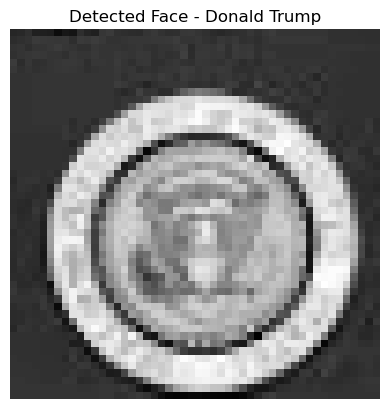

No faces detected in [www.google.com][23828] - Copy.jpg
No faces detected in [www.google.com][23828].jpg


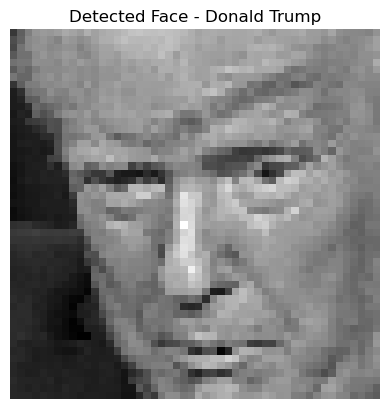

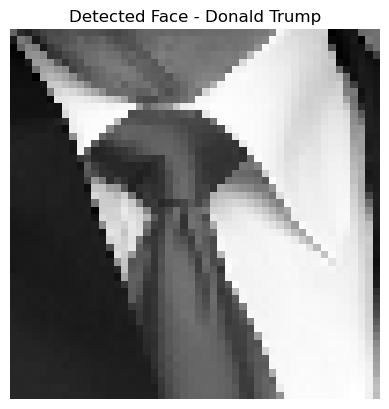

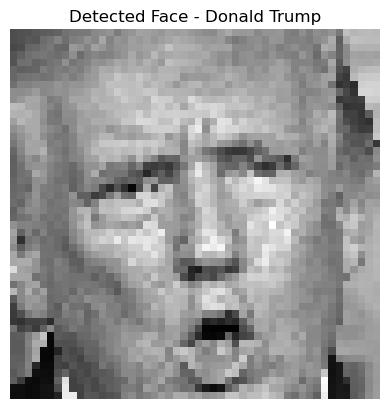

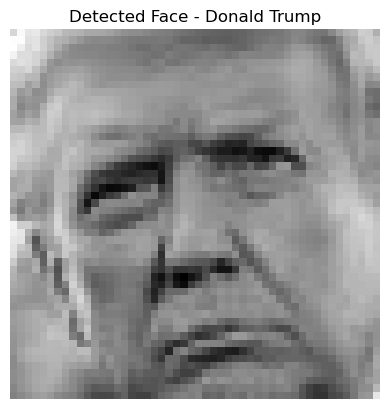

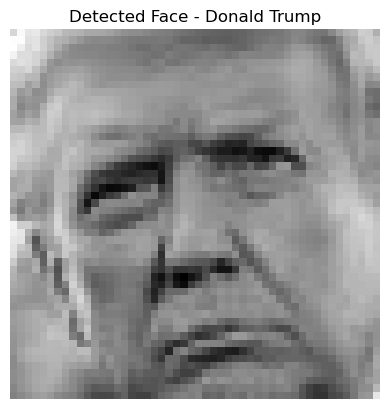

...

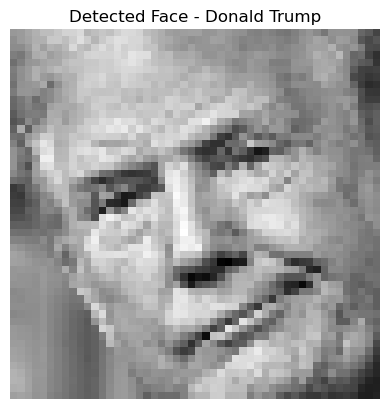

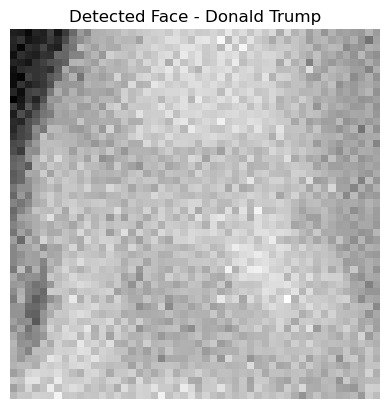

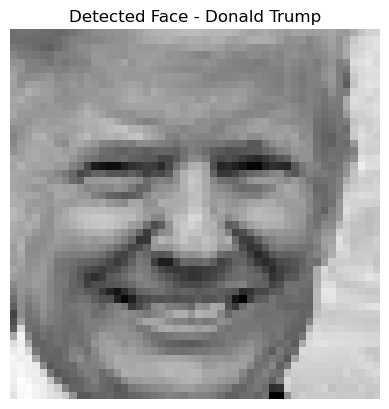

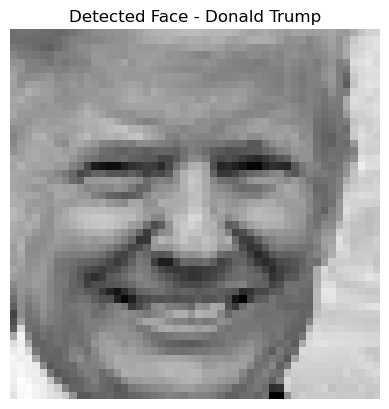

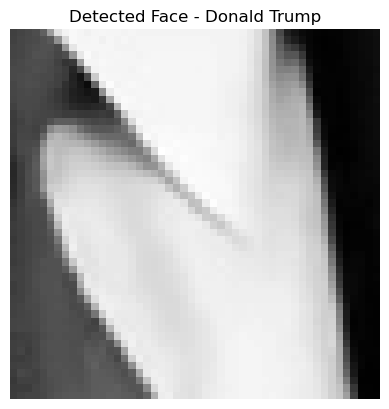

No faces detected in [www.google.com][29612] - Copy.jpg
No faces detected in [www.google.com][29612].jpg


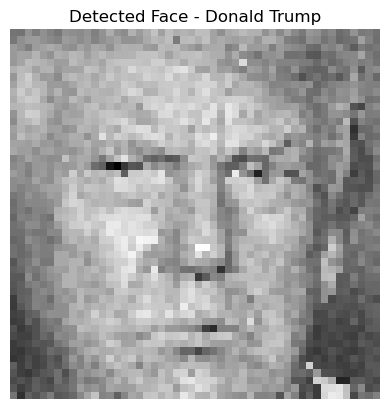

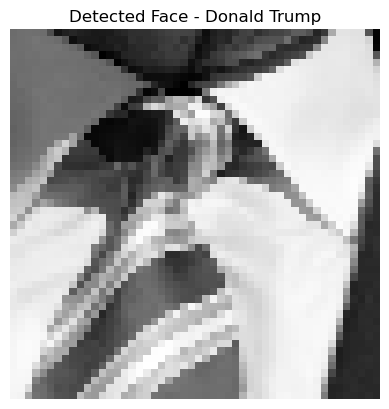

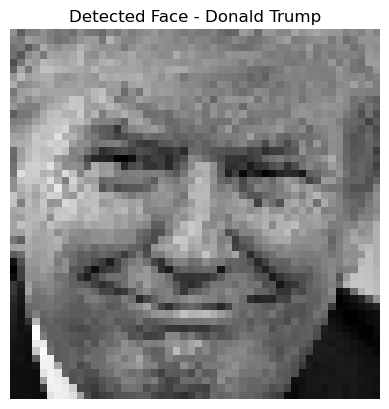

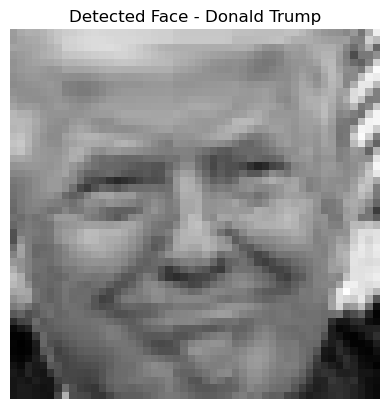

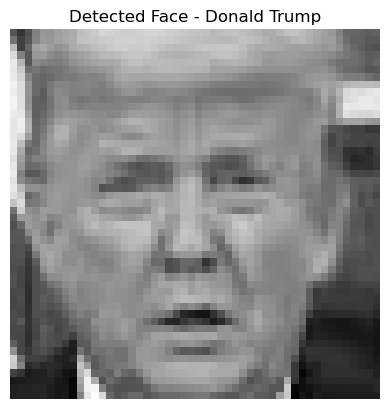

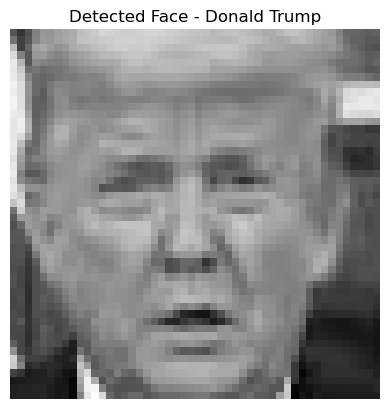

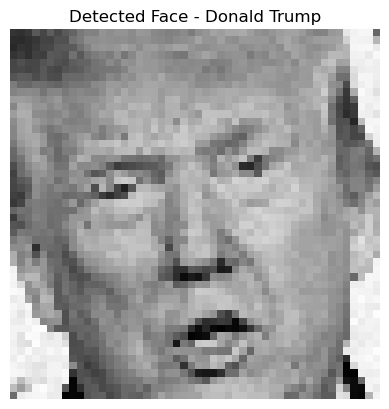

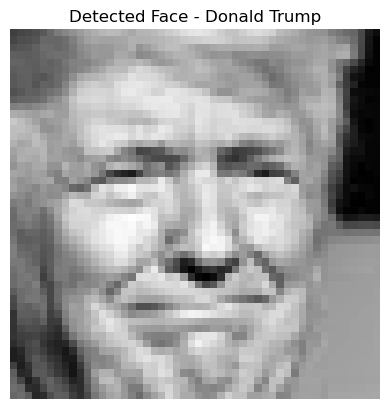

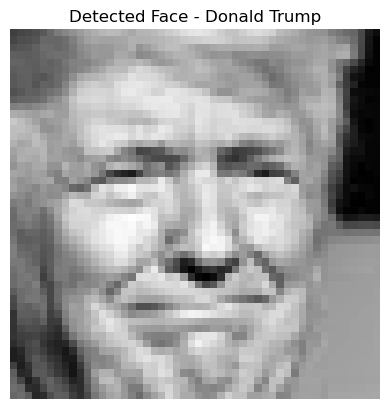

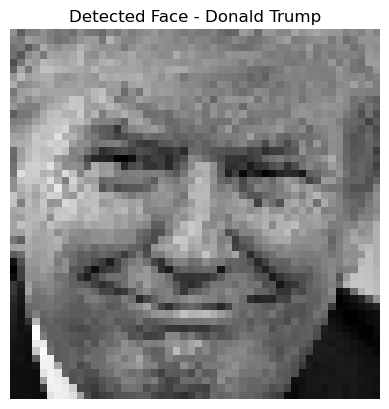

No faces detected in [www.google.com][33123] - Copy.jpg
No faces detected in [www.google.com][33123].jpg


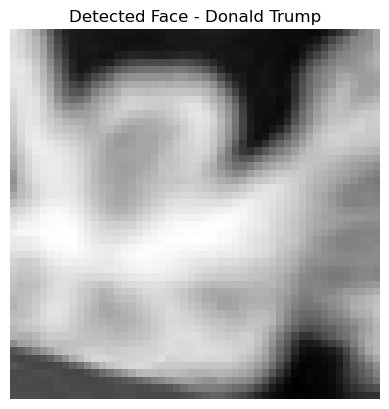

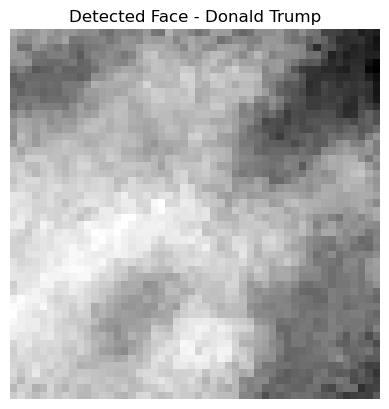

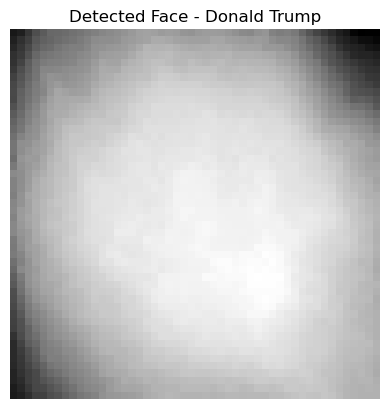

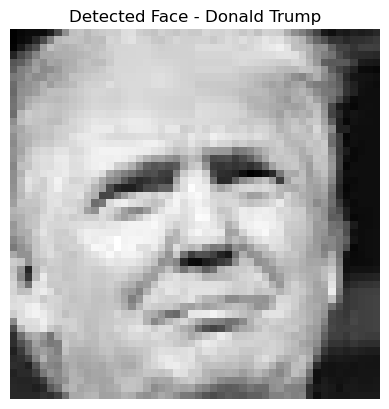

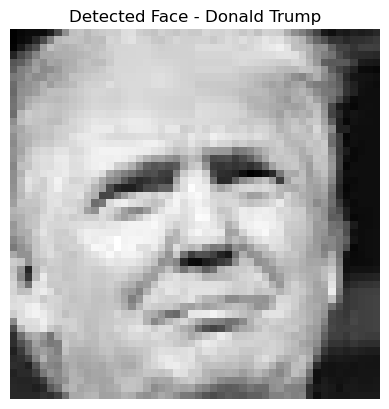

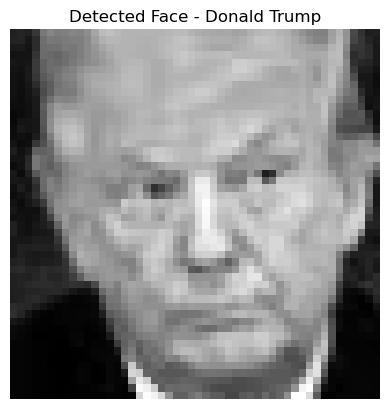

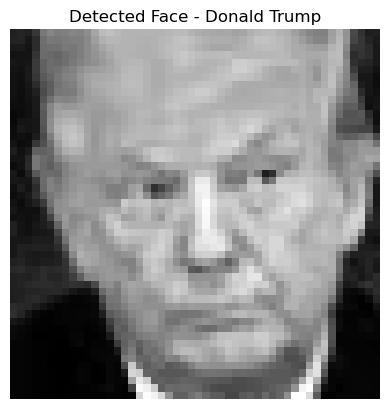

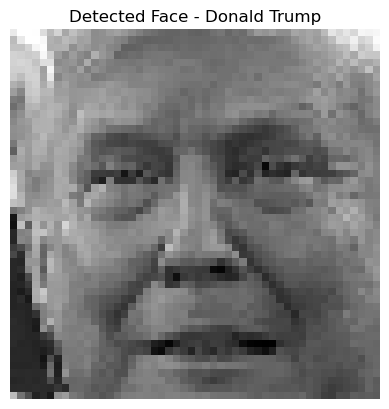

No faces detected in [www.google.com][35920] - Copy.jpg
No faces detected in [www.google.com][35920].jpg


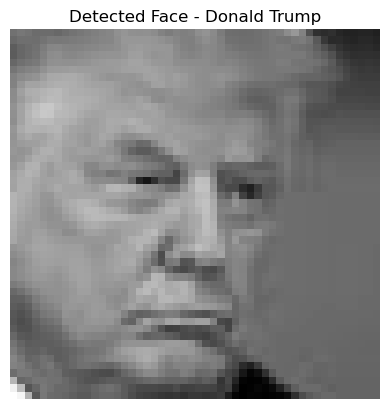

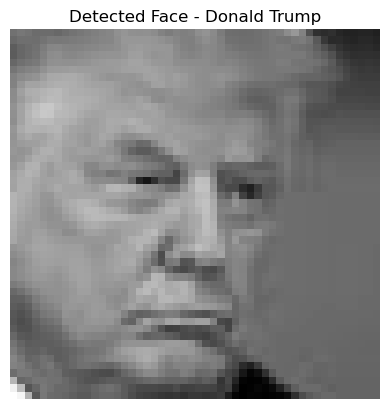

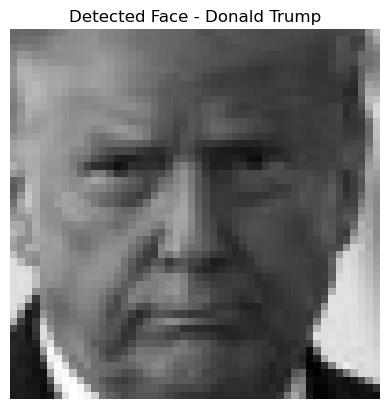

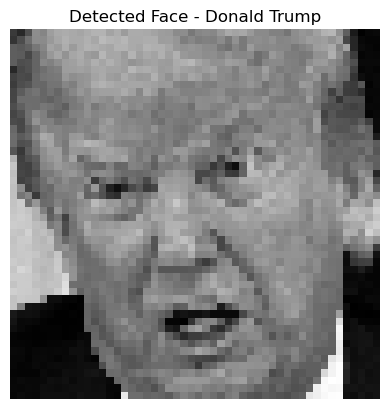

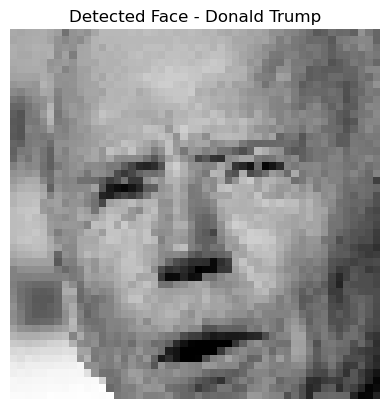

...

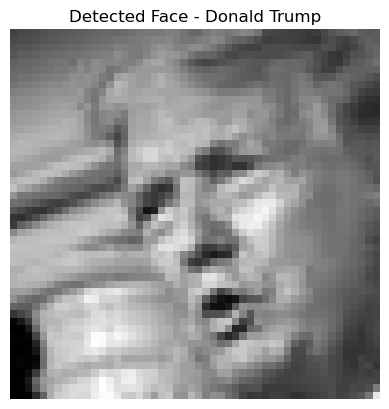

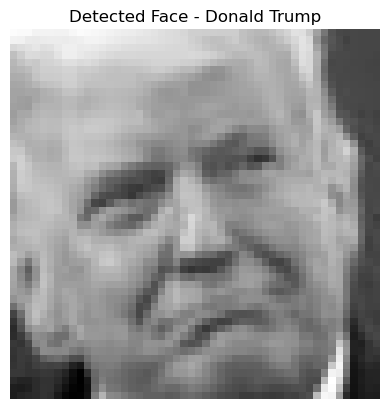

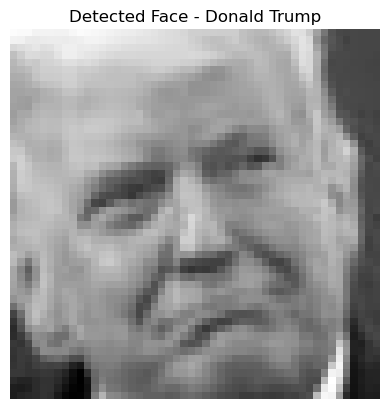

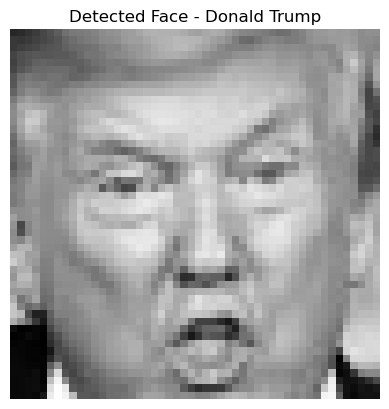

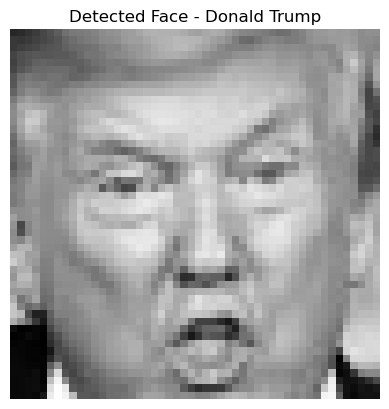

No faces detected in [www.google.com][51404] - Copy.jpg
No faces detected in [www.google.com][51404].jpg


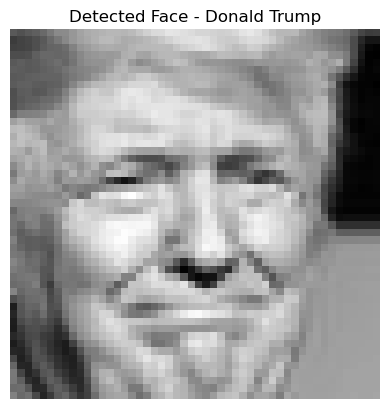

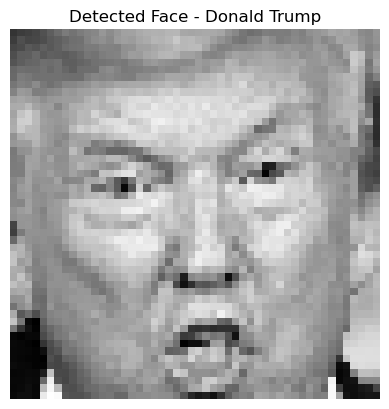

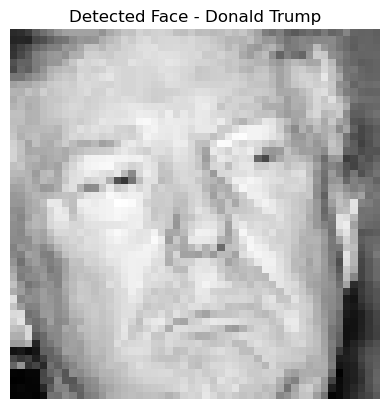

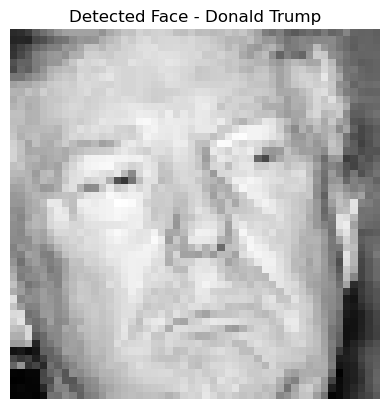

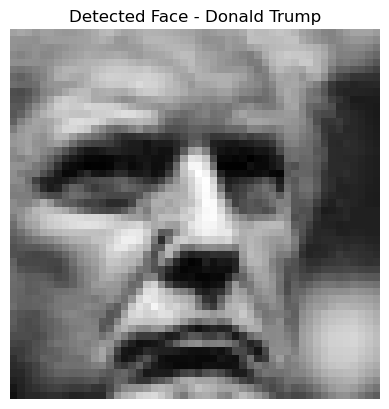

...

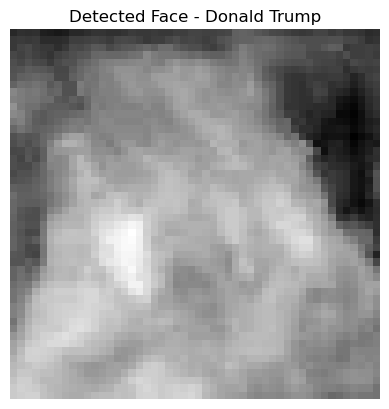

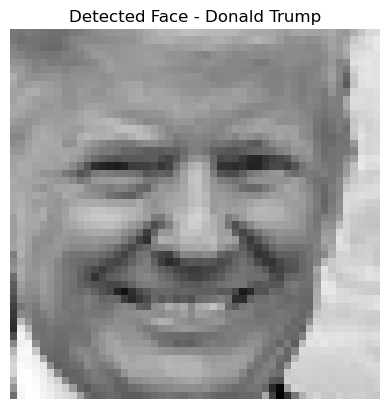

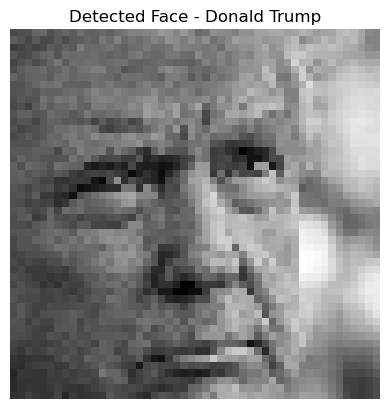

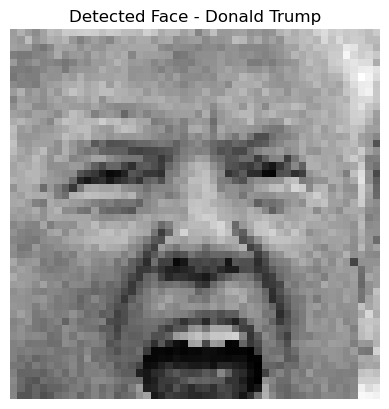

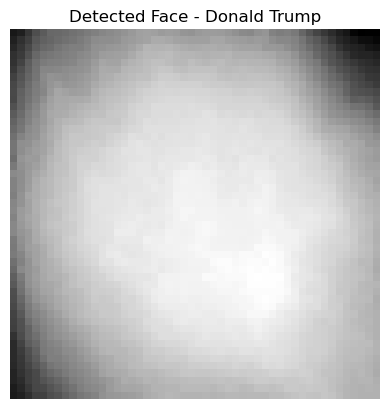

No faces detected in [www.google.com][56483] - Copy.jpg
No faces detected in [www.google.com][56483].jpg


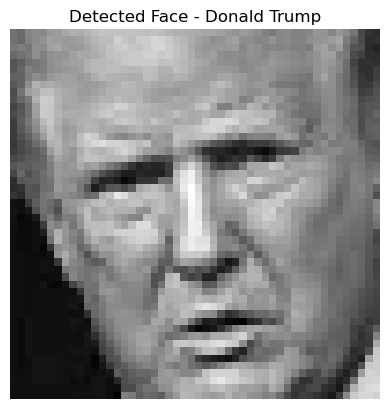

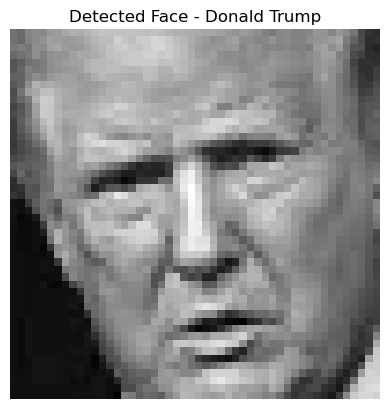

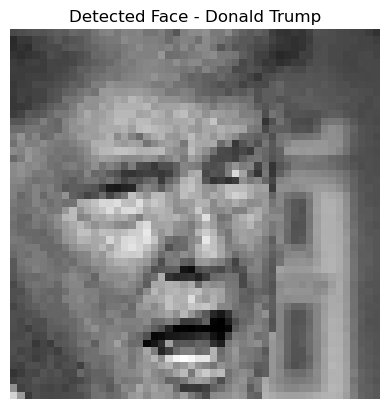

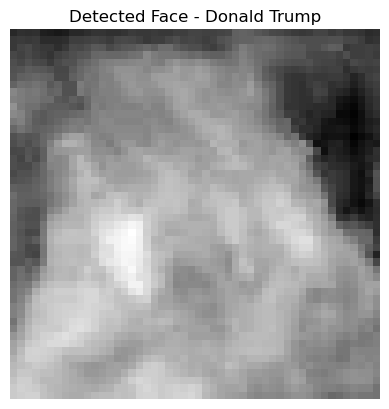

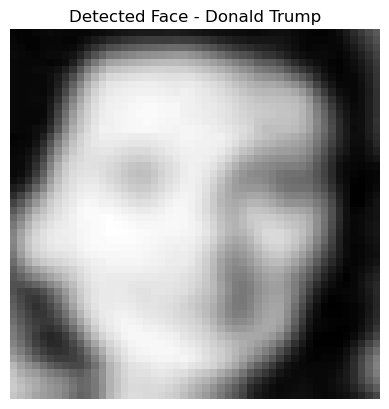

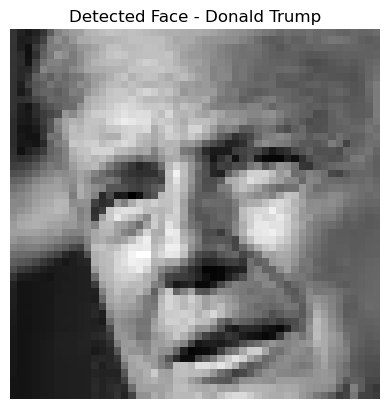

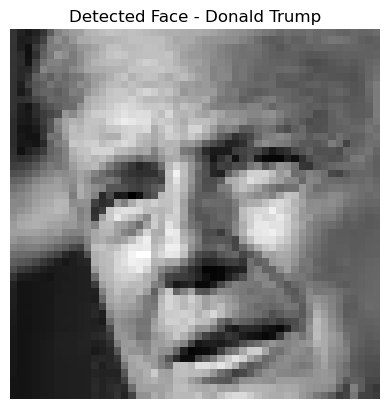

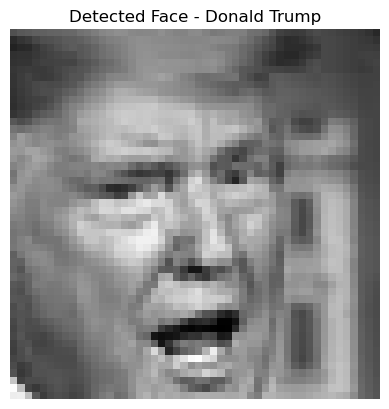

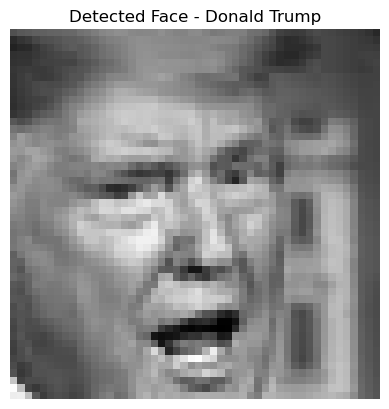

No faces detected in [www.google.com][62596] - Copy.jpg
No faces detected in [www.google.com][62596].jpg


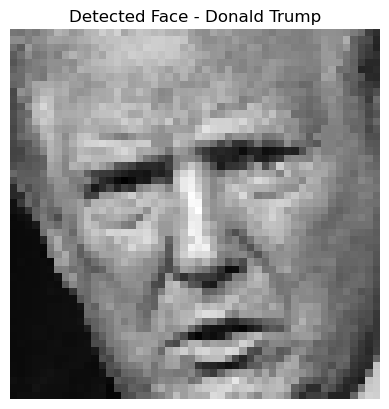

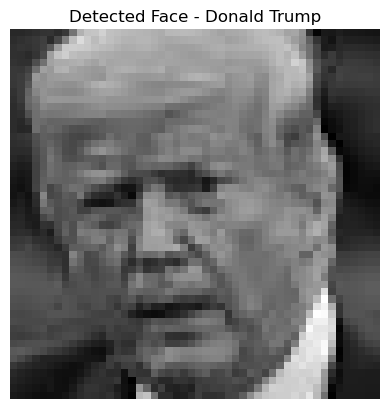

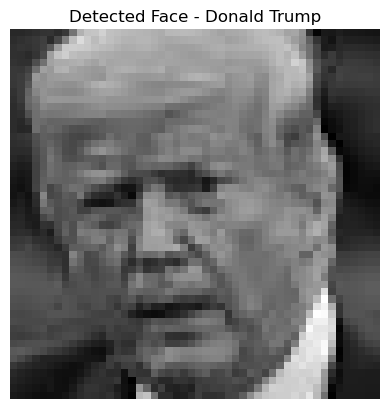

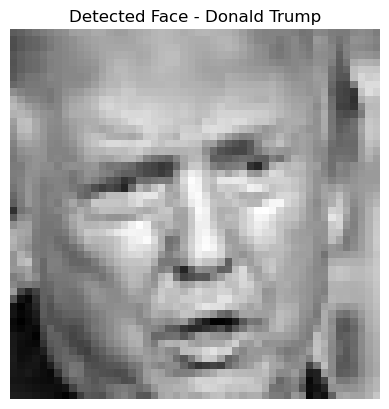

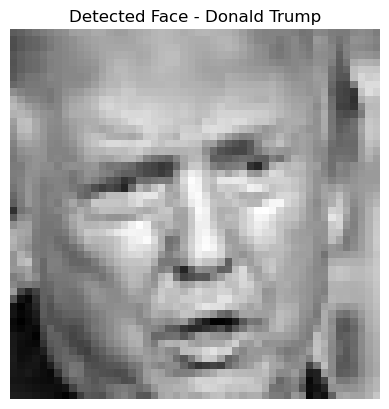

No faces detected in [www.google.com][63697] - Copy.jpg
No faces detected in [www.google.com][63697].jpg


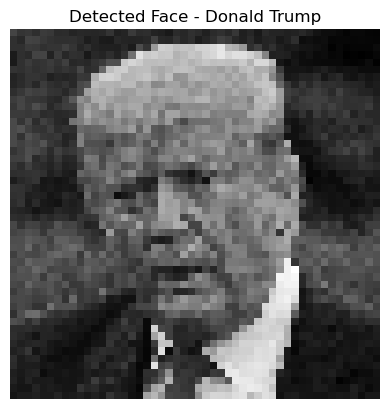

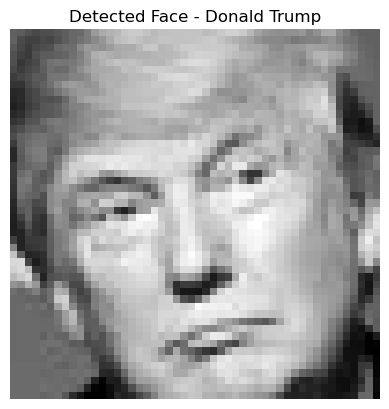

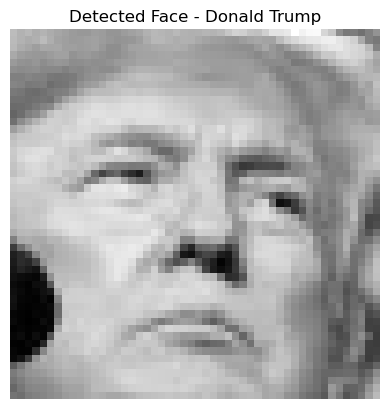

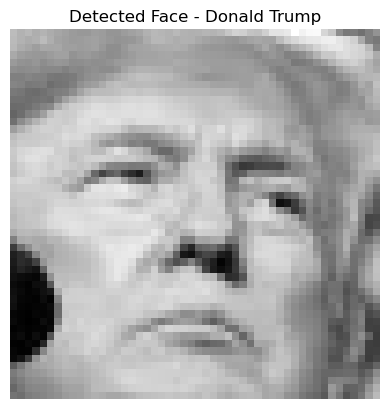

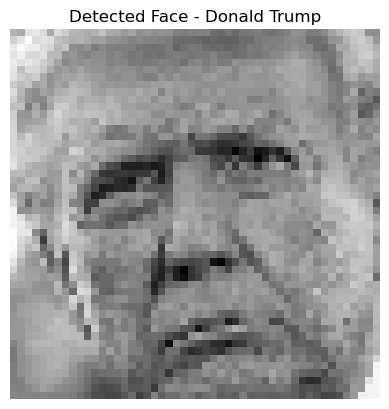

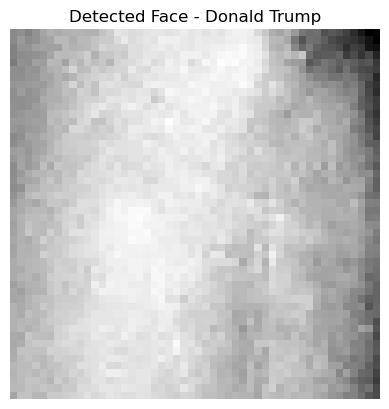

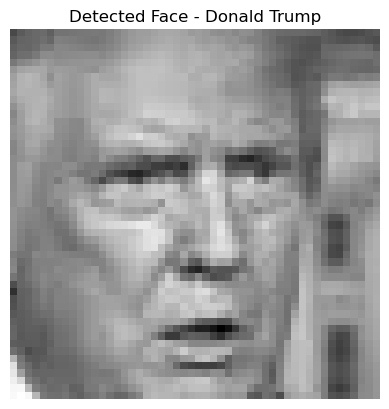

No faces detected in [www.google.com][70630].jpg


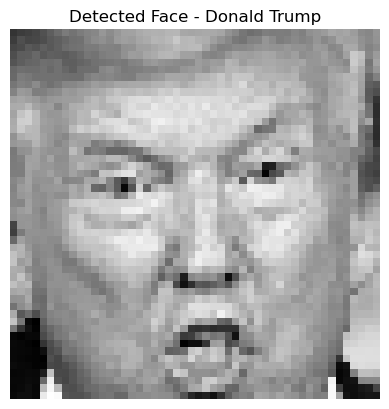

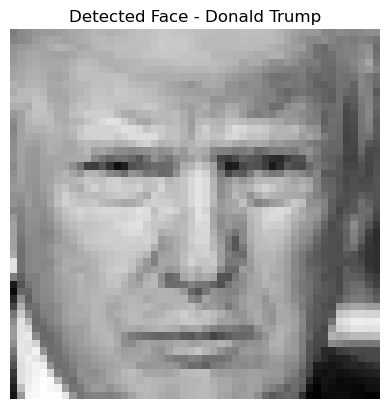

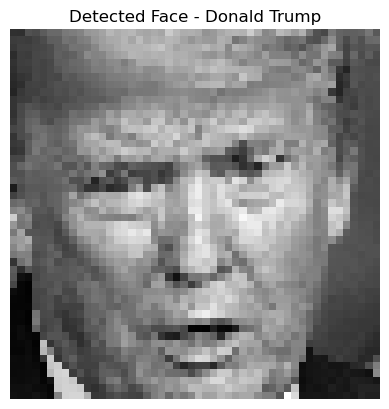

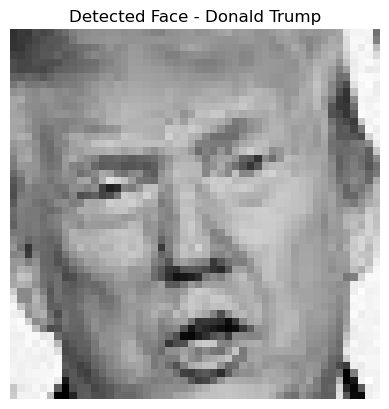

No faces detected in [www.google.com][74332].jpg


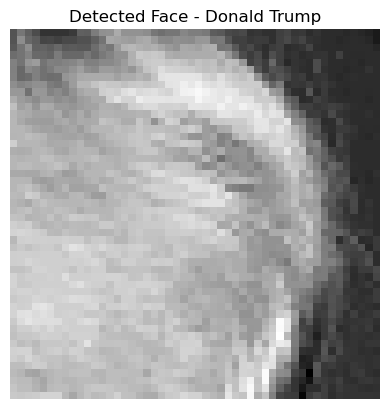

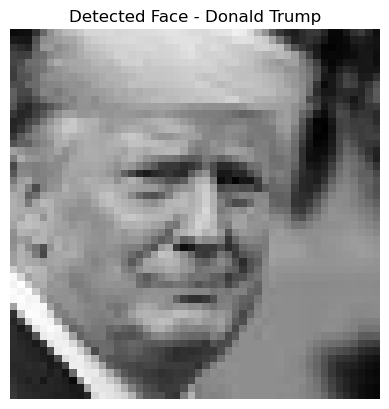

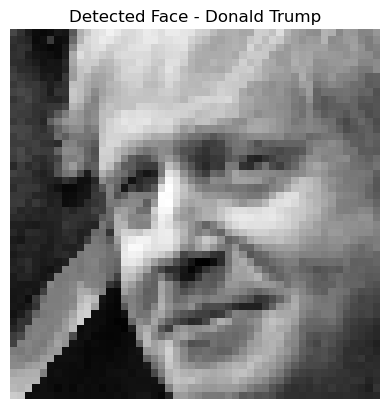

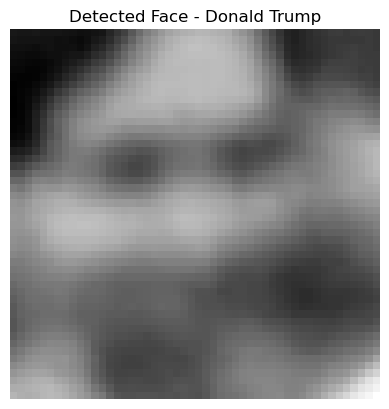

No faces detected in [www.google.com][79709].jpg


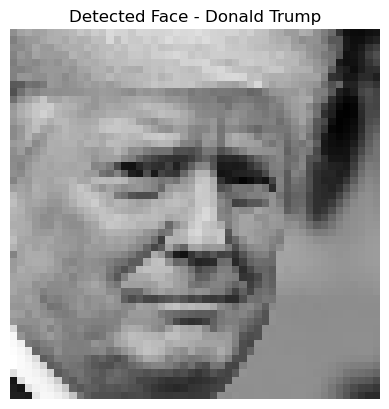

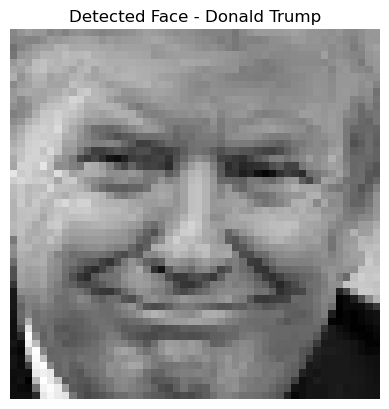

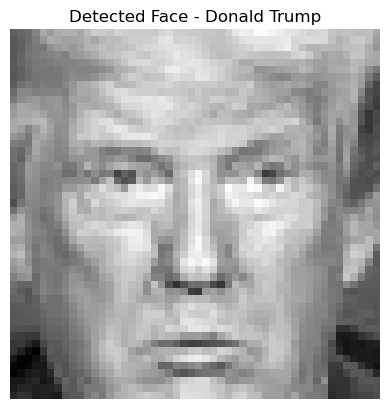

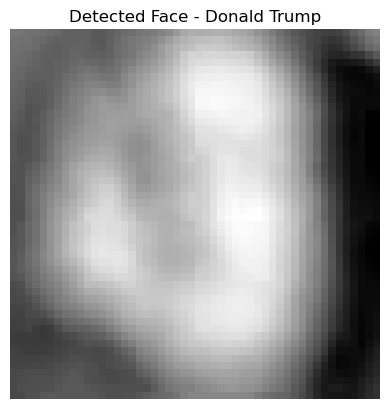

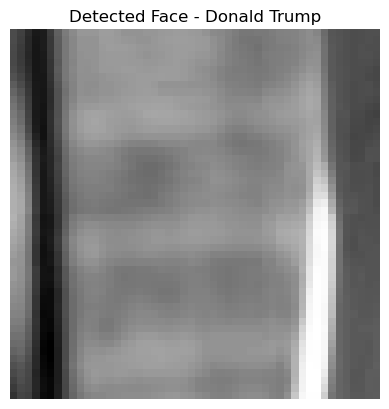

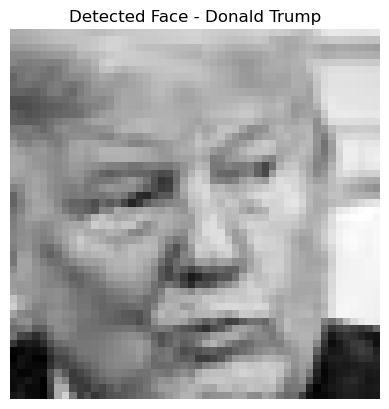

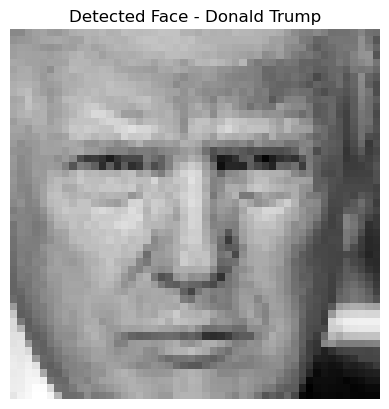

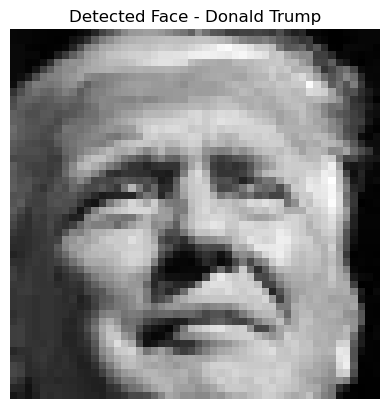

No faces detected in [www.google.com][82786].jpg
No faces detected in [www.google.com][83989].jpg


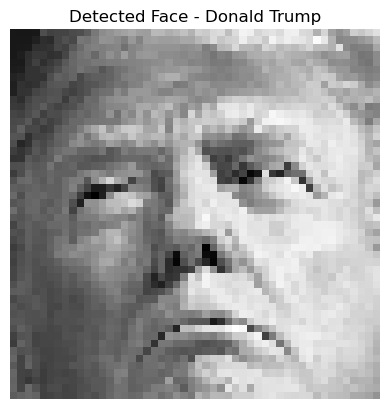

No faces detected in [www.google.com][844]12724684-3x2-xlarge.jpg


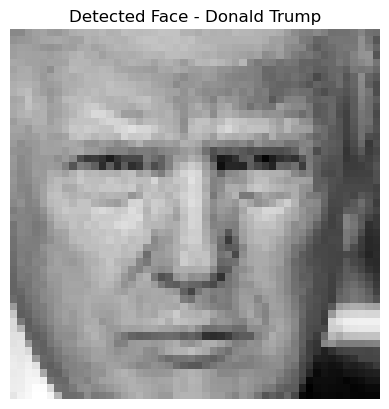

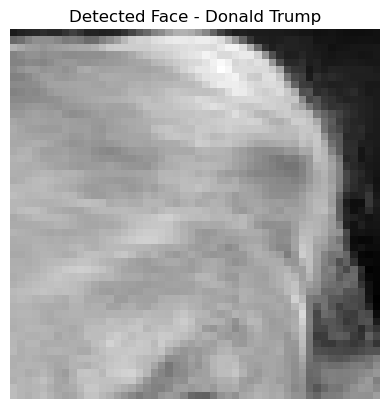

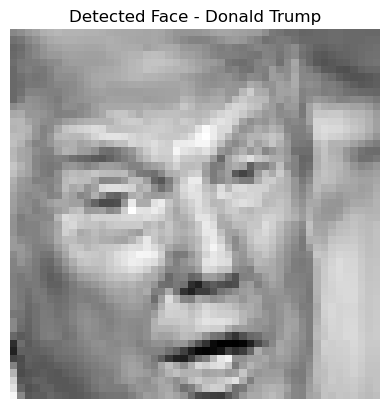

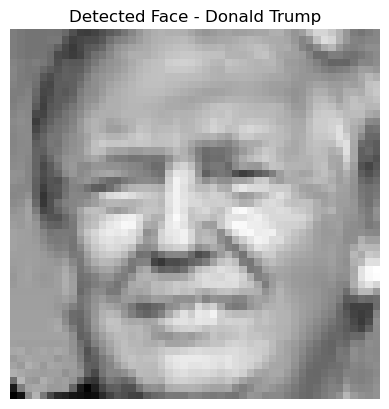

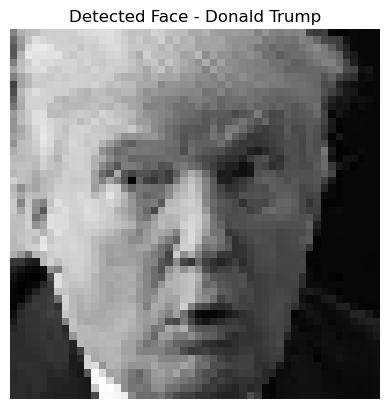

...

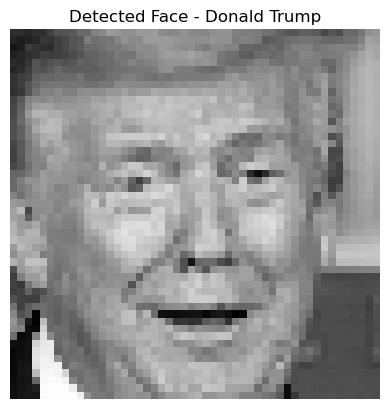

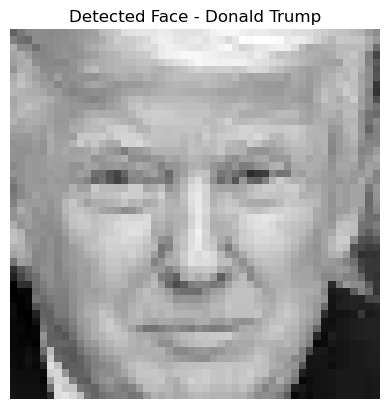

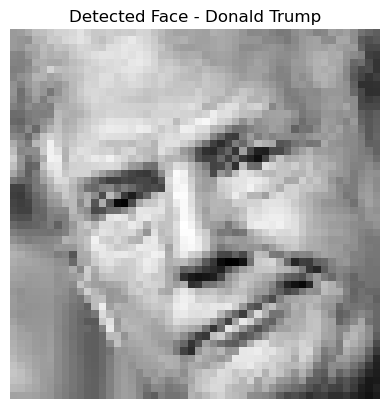

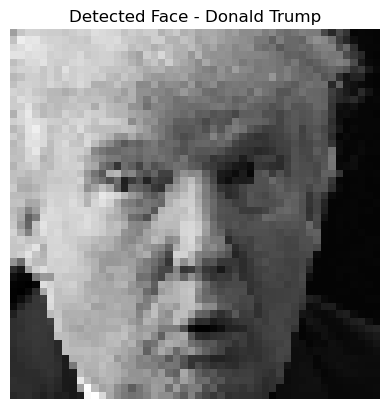

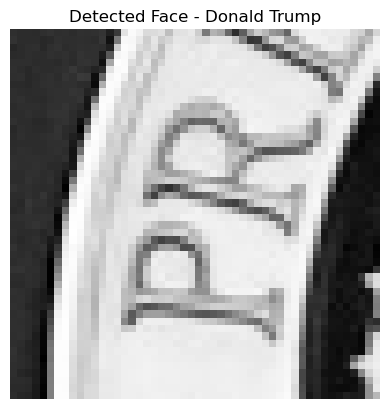

No faces detected in [www.google.com][9100].jpg


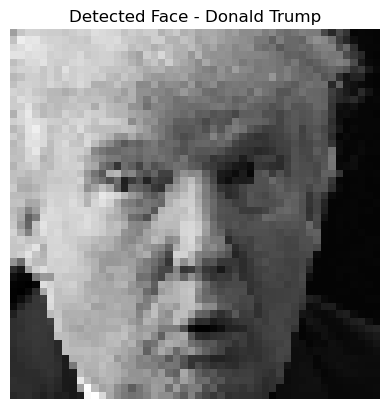

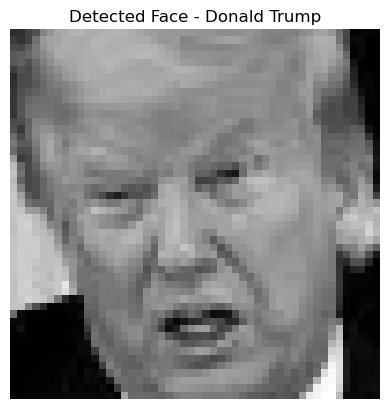

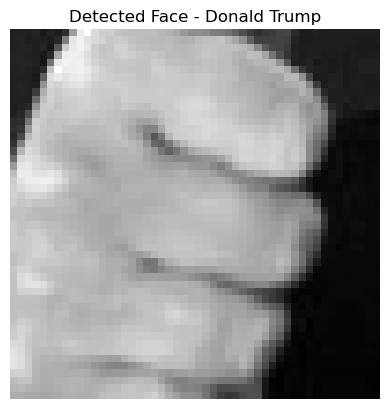

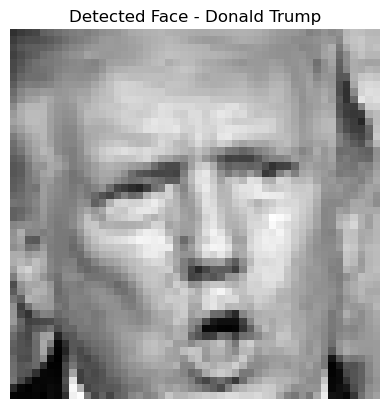

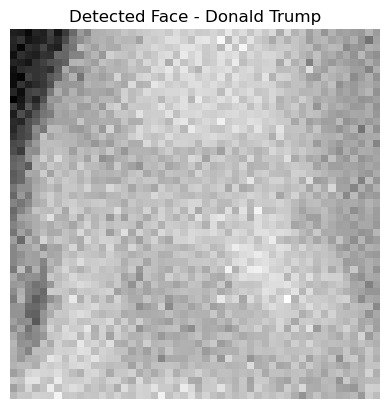

...

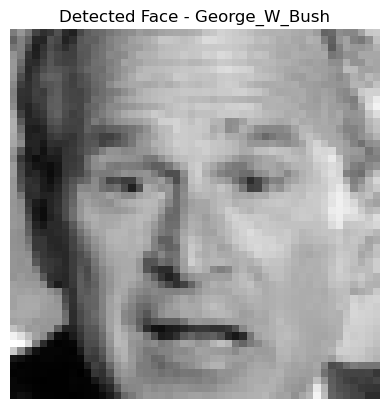

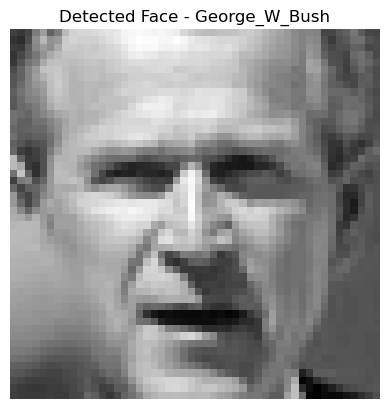

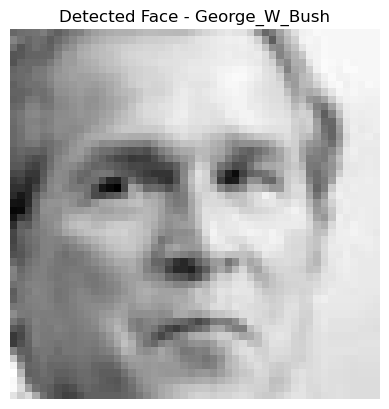

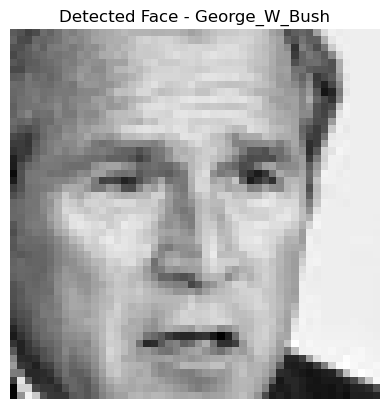

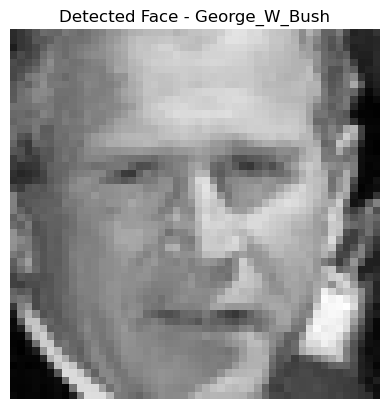

No faces detected in George_W_Bush_0157.jpg


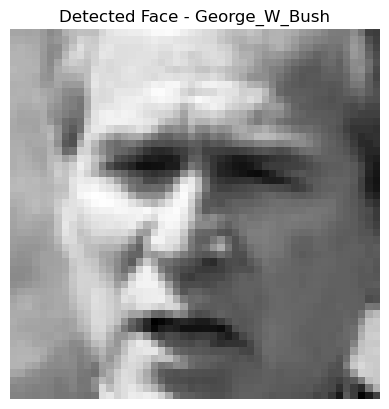

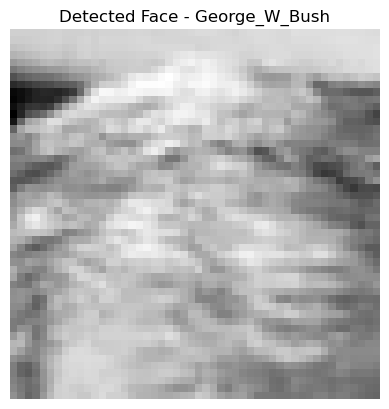

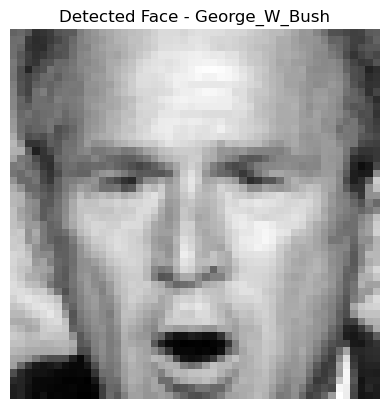

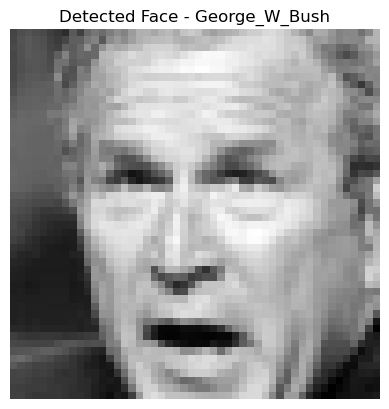

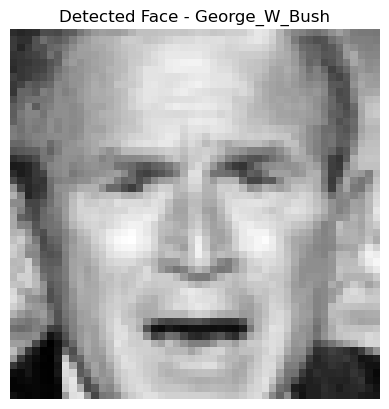

...

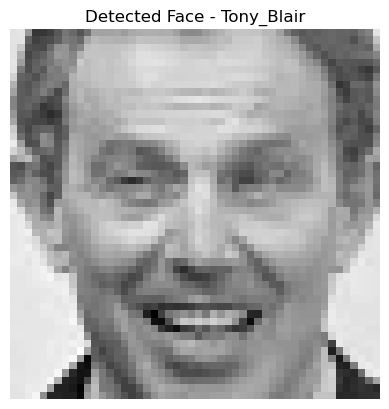

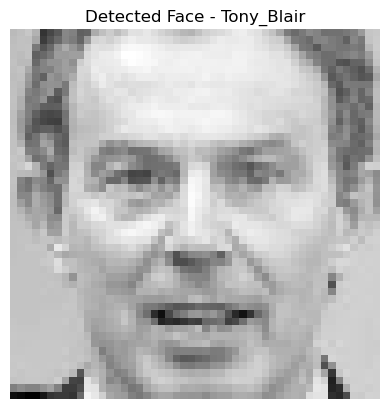

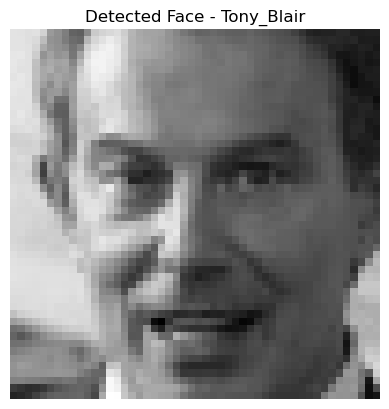

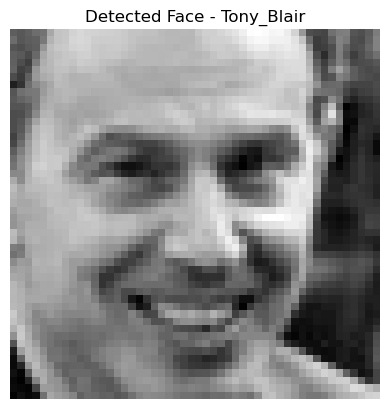

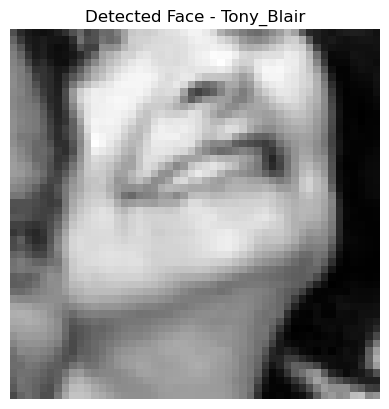

Finished processing. Collected 1128 faces.
Images skipped due to loading errors: 0
Images skipped due to no face detected: 36
Total images attempted: 1164


In [5]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

face_classifier = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

data = []
target = []
skipped_load_error = 0
skipped_no_face = 0
processed_images_count = 0 

for label in labels:
    imgs_path = os.path.join(data_path, label) #get the each catagari one by one
    img_names = os.listdir(imgs_path)

    for img_name in img_names:   # get the each image one by one
        img_path = os.path.join(imgs_path, img_name)
        processed_images_count += 1  # Increment the count for each image processed
        img = cv2.imread(img_path)

        if img is None: # idintify loading error data
            print(f"Warning: Could not load image {img_path}")
            skipped_load_error += 1
            continue

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # convert to the image gray scale
        faces = face_classifier.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30)) # idintify face 

        if len(faces) == 0:
            print(f"No faces detected in {img_name}") #idintify no face image
            skipped_no_face += 1
            continue

        try:
            for (x, y, w, h) in faces:
                cropped_face = gray[y:y+h, x:x+w]
                cropped_face = cv2.resize(cropped_face, (50, 50)) # crope the face
                data.append(cropped_face)
                target.append(category_dict[label])

                # Show first detected face (optional)
                plt.imshow(cropped_face, cmap="gray")
                plt.title(f"Detected Face - {label}")
                plt.axis("off")
                plt.show()
                break  # Show only one face per image for preview

        except Exception as e:
            print(f"Error processing image {img_name}: {e}")
            pass

print(f"Finished processing. Collected {len(data)} faces.")
print(f"Images skipped due to loading errors: {skipped_load_error}")
print(f"Images skipped due to no face detected: {skipped_no_face}")
print(f"Total images attempted: {processed_images_count}")


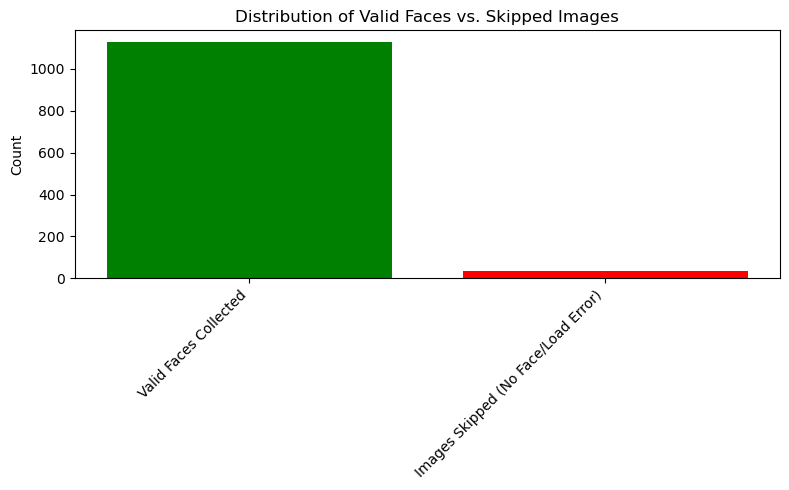

In [6]:
import matplotlib.pyplot as plt

# Assuming 'data', 'skipped_load_error', and 'skipped_no_face' are available from the previous processing step.

valid_faces_count = len(data)
# We can consider images skipped due to no face or loading errors as "invalid" image sources for face data
invalid_images_count = skipped_load_error + skipped_no_face

# Prepare data for plotting
categories = ['Valid Faces Collected', 'Images Skipped (No Face/Load Error)']
counts = [valid_faces_count, invalid_images_count]

# Create the bar chart
plt.figure(figsize=(8, 5))
plt.bar(categories, counts, color=['green', 'red'])
plt.ylabel("Count")
plt.title("Distribution of Valid Faces vs. Skipped Images")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [7]:
data=np.array(data)
data=data.reshape(data.shape[0],data.shape[1]*data.shape[2])
target=np.array(target)
print("Flattened data shape:", data.shape)

Flattened data shape: (1128, 2500)


# 03. IT24102314 – Outlier Detection / Removal

Technique: Identified unusual images using brightness/variance.

Problem: Some cropped faces were too dark, bright, or partially detected.

Solution:

    Compute mean brightness & variance per image.
    Use boxplots to detect/remove outliers.

Why Needed: Outliers confuse the model → removing them improves accuracy.

Visualization: Boxplot of pixel intensity; outliers appear outside whiskers.

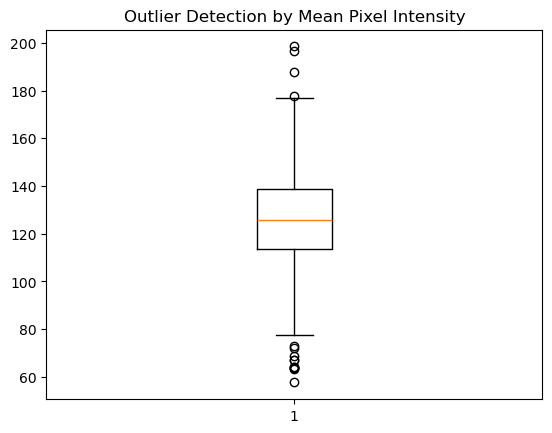

In [8]:
mean_intensity = np.mean(data, axis=1)
plt.boxplot(mean_intensity)
plt.title("Outlier Detection by Mean Pixel Intensity")
plt.show()

In [9]:

mask = (mean_intensity > mean_intensity.mean() - 1.5*mean_intensity.std()) & \
       (mean_intensity < mean_intensity.mean() + 1.5*mean_intensity.std())
data = data[mask]
target = target[mask]

print("After outlier removal:", data.shape)

After outlier removal: (995, 2500)


# 04. IT24102267 – StandardScaler / Scaling

Technique: StandardScaler (mean = 0, std = 1).

Problem: Pixel values (0–255) can dominate and affect SVM/PCA.

Solution: Applied StandardScaler to normalize all features.

Why Needed: Ensures equal feature contribution, avoids bias from large values, improves model convergence.

Visualization: Histogram of pixel intensities before vs after scaling.

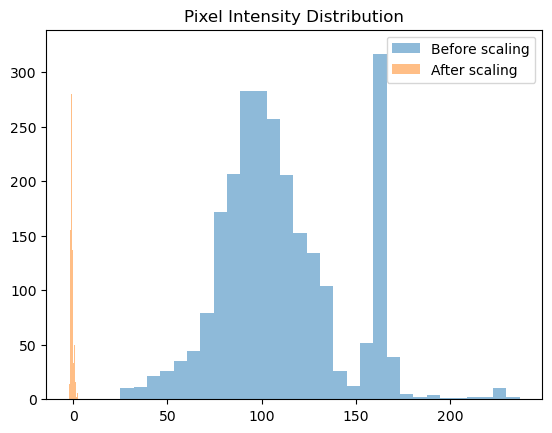

In [10]:

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Histogram before vs after scaling
plt.hist(data[0], bins=30, alpha=0.5, label="Before scaling")
plt.hist(data_scaled[0], bins=30, alpha=0.5, label="After scaling")
plt.legend()
plt.title("Pixel Intensity Distribution")
plt.show()

# 05. IT24102313  – Feature Engineering (PCA)

Technique: Applied PCA for dimensionality reduction.

Problem: Each image = 2500 features → 200 too high-dimensional, risk of overfitting.

Solution: Reduced to ~200 components while keeping most variance.

Why Needed:

    Faster training.
    Removes noise.
    Avoids curse of dimensionality.

Visualization: Scree plot (variance explained).

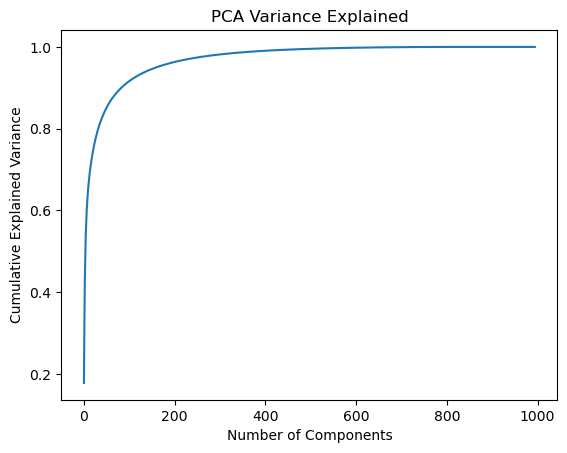

In [11]:
from sklearn.decomposition import PCA 
import matplotlib.pyplot as plt 

pca = PCA()
pca.fit(data)

# Variance explained plot
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA Variance Explained")
plt.show()

In [12]:
pca = PCA(n_components=200,whiten = True , random_state = 42) 
data_pca = pca.fit_transform(data_scaled)
print(data_pca.shape)

(995, 200)


# 06. IT24102310 – Feature Selection / Correlation Analysis

Technique: Removed uninformative/redundant features.

Problem: Many pixel features (e.g., background) had little/no variance.

Solution:

    Removed low-variance + highly correlated features.

Why Needed: Prevents overfitting, improves training efficiency.

Visualization: Variance distribution plot before vs after selection.

please give the solushion dont use code


In [13]:
from sklearn.feature_selection import VarianceThreshold # Import VarianceThreshold

selector = VarianceThreshold(threshold=0.01)  # remove very low variance features
data_selected = selector.fit_transform(data_pca)
print("After Feature Selection:", data_selected.shape)

After Feature Selection: (995, 200)


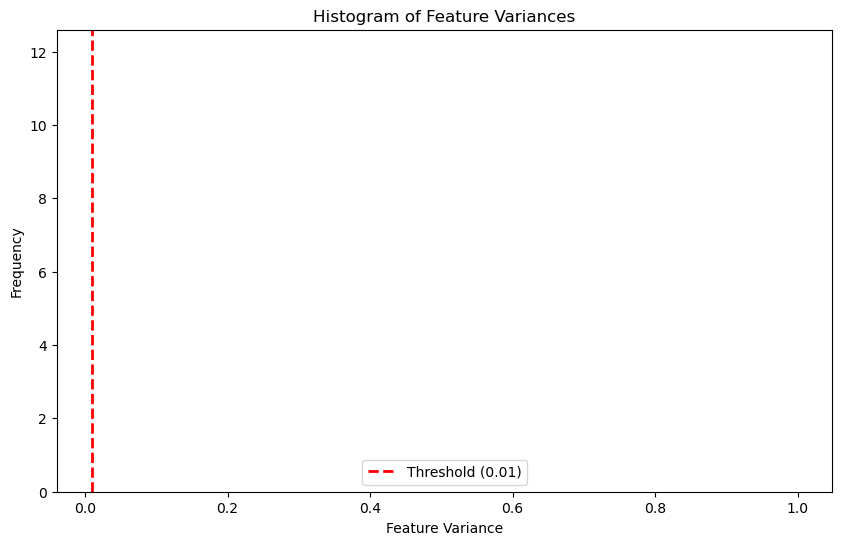

In [14]:
# Histogram of Feature Variance with Threshold Line
variances = np.var(data_pca, axis=0) # Calculate variance for each feature

plt.figure(figsize=(10, 6))
plt.hist(variances, bins=50)
plt.axvline(x=selector.threshold, color='r', linestyle='dashed', linewidth=2, label=f'Threshold ({selector.threshold})')
plt.xlabel("Feature Variance")
plt.ylabel("Frequency")
plt.title("Histogram of Feature Variances")
plt.legend()
plt.show()


`data.npy` → Processed face features.

`target.npy` → Encoded labels. 

In [15]:
np.save("final_data.npy", data_selected)
np.save("final_target.npy", target)

print("Final data shape:", data_selected.shape)
print("Final target shape:", target.shape)

Final data shape: (995, 200)
Final target shape: (995,)
